<a href="https://colab.research.google.com/github/sreehari-odu/covid_19_USA/blob/main/CS620_Project_Sree_hari.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CS 620 Project Abstract**


# **Introduction**

Name: Sree Hari Thiriveedhi

Email: sthir004@odu.edu

Web Portfolio: https://sreehari-odu.github.io/






# **Data Source:**

Two datasets from CDC will be used for this project. One dataset provides information about demographics for COVID-19 cases and the second dataset priovides information about cases and deaths by state. 


Dataset 1: COVID-19 Case Surveillance Public Use Data

URL: https://data.cdc.gov/Case-Surveillance/COVID-19-Case-Surveillance-Public-Use-Data/vbim-akqf

Dataset 2: United States COVID-19 Cases and Deaths by State over Time

URL: https://data.cdc.gov/Case-Surveillance/United-States-COVID-19-Cases-and-Deaths-by-State-o/9mfq-cb36


In [ ]:
!pip install --upgrade geopandas
!pip install --upgrade pyshp
!pip install --upgrade shapely
!pip install --upgrade plotly-geo
!pip install --upgrade geojson
!pip install --upgrade plotly


     |████████████████████████████████| 1.0MB 4.4MB/s 
     |████████████████████████████████| 15.3MB 248kB/s 
     |████████████████████████████████| 6.5MB 39.5MB/s 
     |████████████████████████████████| 225kB 4.3MB/s 
  Created wheel for pyshp: filename=pyshp-2.1.3-cp37-none-any.whl size=37264 sha256=64d9e33f0ed441eb5bb541ae9cb7131caf8d4bc0625f6c6275b1847cd31e1e7c
  Stored in directory: /root/.cache/pip/wheels/76/2b/d4/53e6b9a0fb0a9f9f29664cf82605af8bc81d5ab44d987896dd
Successfully built pyshp
Requirement already up-to-date: shapely in /usr/local/lib/python3.7/dist-packages (1.7.1)
     |████████████████████████████████| 23.7MB 6.8MB/s 
     |████████████████████████████████| 13.2MB 5.4MB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [ ]:
!pip install pandas-profiling

# **Dataset**

In [ ]:
import csv
from pandas import Series,DataFrame
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import math
import time
import random
import plotly.express as px
import plotly.graph_objs as go 
import plotly.offline as py
import json 
from urllib.request import urlopen
import warnings## to avoid warning messages
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

from datetime import date, timedelta
from datetime import date
import folium
from folium.plugins import TimeSliderChoropleth
import pandas_profiling as pf
dataset = pd.read_csv('https://data.cdc.gov/api/views/9mfq-cb36/rows.csv?accessType=DOWNLOAD',",") 
pd.set_option('display.max_columns',None)
#print(dataset.columns.to_list(),'\n')
display(dataset)



,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,05/04/2020,KY,5245,5245.0,0.0,115,0.0,261,261.0,0.0,8,0.0,05/05/2020 05:25:08 PM,Agree,Agree
1,03/23/2020,NH,101,NaN,NaN,23,NaN,1,NaN,NaN,1,NaN,03/26/2020 04:22:39 PM,Not agree,Not agree
2,08/21/2020,MD,103523,NaN,NaN,624,0.0,3685,3546.0,139.0,11,1.0,08/22/2020 02:21:09 PM,NaN,Agree
3,02/27/2021,MS,294795,182857.0,111938.0,704,478.0,6681,4672.0,2009.0,12,7.0,02/28/2021 02:48:18 PM,Agree,Agree
4,03/12/2020,NJ,29,NaN,NaN,6,NaN,1,NaN,NaN,0,NaN,03/26/2020 04:22:39 PM,Agree,Agree
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27295,10/09/2020,GU,2989,NaN,NaN,0,0.0,58,NaN,NaN,0,0.0,10/10/2020 01:30:17 PM,Not agree,Not agree
27296,07/21/2020,MO,45475,NaN,NaN,1216,13.0,1143,NaN,NaN,11,0.0,07/23/2020 12:00:00 AM,Not agree,Not agree
27297,02/24/2021,AL,490220,383882.0,106338.0,1247,271.0,9744,7643.0,2101.0,84,16.0,02/25/2021 02:54:32 PM,Agree,Agree
27298,05/17/2020,MN,16372,NaN,NaN,704,0.0,739,731.0,8.0,9,0.0,05/18/2020 04:01:54 PM,NaN,Agree


In [ ]:
state_mapping = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}

In [ ]:
dataset.dtypes

submission_date     object
state               object
tot_cases            int64
conf_cases         float64
prob_cases         float64
new_case             int64
pnew_case          float64
tot_death            int64
conf_death         float64
prob_death         float64
new_death            int64
pnew_death         float64
created_at          object
consent_cases       object
consent_deaths      object
dtype: object

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27300 entries, 0 to 27299
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   submission_date  27300 non-null  object 
 1   state            27300 non-null  object 
 2   tot_cases        27300 non-null  int64  
 3   conf_cases       12250 non-null  float64
 4   prob_cases       12249 non-null  float64
 5   new_case         27300 non-null  int64  
 6   pnew_case        22389 non-null  float64
 7   tot_death        27300 non-null  int64  
 8   conf_death       12614 non-null  float64
 9   prob_death       12614 non-null  float64
 10  new_death        27300 non-null  int64  
 11  pnew_death       22198 non-null  float64
 12  created_at       27300 non-null  object 
 13  consent_cases    22295 non-null  object 
 14  consent_deaths   23205 non-null  object 
dtypes: float64(6), int64(4), object(5)
memory usage: 3.1+ MB


###**Sorting and Cleaning Data**

In [ ]:
#sorting the data
dataset["submission_date"] = pd.to_datetime(dataset["submission_date"])
sor = dataset.sort_values(by="submission_date", ascending=False)
display(sor)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
11795,2021-04-20,CO,493029,461748.0,31281.0,1963,216.0,6211,5474.0,737.0,10,0.0,04/21/2021 02:12:05 PM,Agree,Agree
6634,2021-04-20,MO,578739,NaN,NaN,704,293.0,8689,NaN,NaN,5,0.0,04/21/2021 02:12:05 PM,Not agree,Not agree
24134,2021-04-20,FSM,1,1.0,0.0,0,0.0,0,0.0,0.0,0,0.0,04/21/2021 02:12:05 PM,Agree,Agree
3913,2021-04-20,AL,523955,405760.0,118195.0,333,167.0,10798,8507.0,2291.0,8,-1.0,04/21/2021 02:12:05 PM,Agree,Agree
9166,2021-04-20,PW,0,NaN,NaN,0,0.0,0,NaN,NaN,0,0.0,04/21/2021 02:12:05 PM,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9039,2020-01-22,NY,0,NaN,NaN,0,NaN,0,NaN,NaN,0,NaN,03/26/2020 04:22:39 PM,Not agree,Not agree
12332,2020-01-22,PR,0,NaN,NaN,0,NaN,0,NaN,NaN,0,NaN,03/26/2020 04:22:39 PM,Agree,Agree
22475,2020-01-22,GU,0,NaN,NaN,0,NaN,0,NaN,NaN,0,NaN,03/26/2020 04:22:39 PM,Not agree,Not agree
18279,2020-01-22,FL,0,NaN,NaN,0,NaN,0,NaN,NaN,0,NaN,03/26/2020 04:22:39 PM,Not agree,Not agree


In [ ]:
#cleaning the data
cleandata = dataset.fillna({
    'conf_cases':0,
    'prob_cases':0,
    'conf_death':0,
    'prob_death':0,
    'pnew_case':0,
    'pnew_death':0,
    'consent_cases':"Neutral",
    'consent_deaths':"Neutral"})
data = cleandata.where(~cleandata['state'].isin(["AS","FSM","GU","MP","VI","RMI","PW","DC"]))
data = data.dropna()
display(data)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2020-05-04,KY,5245.0,5245.0,0.0,115.0,0.0,261.0,261.0,0.0,8.0,0.0,05/05/2020 05:25:08 PM,Agree,Agree
1,2020-03-23,NH,101.0,0.0,0.0,23.0,0.0,1.0,0.0,0.0,1.0,0.0,03/26/2020 04:22:39 PM,Not agree,Not agree
2,2020-08-21,MD,103523.0,0.0,0.0,624.0,0.0,3685.0,3546.0,139.0,11.0,1.0,08/22/2020 02:21:09 PM,Neutral,Agree
3,2021-02-27,MS,294795.0,182857.0,111938.0,704.0,478.0,6681.0,4672.0,2009.0,12.0,7.0,02/28/2021 02:48:18 PM,Agree,Agree
4,2020-03-12,NJ,29.0,0.0,0.0,6.0,0.0,1.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Agree,Agree
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27294,2020-08-03,ND,6933.0,6933.0,0.0,148.0,0.0,107.0,0.0,0.0,2.0,0.0,08/04/2020 02:09:35 PM,Agree,Not agree
27296,2020-07-21,MO,45475.0,0.0,0.0,1216.0,13.0,1143.0,0.0,0.0,11.0,0.0,07/23/2020 12:00:00 AM,Not agree,Not agree
27297,2021-02-24,AL,490220.0,383882.0,106338.0,1247.0,271.0,9744.0,7643.0,2101.0,84.0,16.0,02/25/2021 02:54:32 PM,Agree,Agree
27298,2020-05-17,MN,16372.0,0.0,0.0,704.0,0.0,739.0,731.0,8.0,9.0,0.0,05/18/2020 04:01:54 PM,Neutral,Agree


#**Total Cases and Deaths**

In [ ]:
today = date.today()
#update_case =  str(today - datetime.timedelta(days=2))
update_case =  str(today - timedelta(days=2))
cases = data.where(data['submission_date']== update_case)
display(cases.dropna())

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
243,2021-04-19,MI,882871.0,793881.0,88990.0,4884.0,597.0,17996.0,16901.0,1095.0,62.0,1.0,04/20/2021 02:59:01 PM,Agree,Agree
309,2021-04-19,ME,57965.0,43444.0,14521.0,420.0,168.0,767.0,742.0,25.0,0.0,0.0,04/20/2021 02:59:01 PM,Agree,Agree
1026,2021-04-19,MN,557665.0,0.0,0.0,1284.0,146.0,7104.0,6640.0,464.0,6.0,0.0,04/20/2021 02:59:01 PM,Neutral,Agree
2190,2021-04-19,MS,309585.0,189461.0,120124.0,362.0,208.0,7161.0,4945.0,2216.0,8.0,4.0,04/20/2021 02:59:01 PM,Agree,Agree
3096,2021-04-19,WI,651948.0,590831.0,61117.0,403.0,30.0,7421.0,6710.0,711.0,1.0,0.0,04/20/2021 02:59:01 PM,Agree,Agree
3635,2021-04-19,NH,91783.0,0.0,0.0,197.0,68.0,1270.0,0.0,0.0,0.0,0.0,04/20/2021 02:59:01 PM,Not agree,Not agree
3786,2021-04-19,MD,437584.0,0.0,0.0,925.0,0.0,8592.0,8406.0,186.0,18.0,-1.0,04/20/2021 02:59:01 PM,Neutral,Agree
4040,2021-04-19,WY,57378.0,48535.0,8843.0,37.0,23.0,703.0,703.0,0.0,0.0,0.0,04/20/2021 02:59:01 PM,Agree,Agree
4169,2021-04-19,LA,453351.0,0.0,0.0,466.0,155.0,10293.0,9401.0,892.0,4.0,2.0,04/20/2021 02:59:01 PM,Not agree,Agree
4995,2021-04-19,RI,144966.0,0.0,0.0,0.0,0.0,2651.0,0.0,0.0,0.0,0.0,04/20/2021 02:59:01 PM,Not agree,Neutral


In [ ]:
Total = cases.loc[(cases['tot_cases']>1)]
display(Total.dropna().reset_index(drop = True))
Total_cases = Total.dropna().reset_index(drop = True)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2021-04-19,MI,882871.0,793881.0,88990.0,4884.0,597.0,17996.0,16901.0,1095.0,62.0,1.0,04/20/2021 02:59:01 PM,Agree,Agree
1,2021-04-19,ME,57965.0,43444.0,14521.0,420.0,168.0,767.0,742.0,25.0,0.0,0.0,04/20/2021 02:59:01 PM,Agree,Agree
2,2021-04-19,MN,557665.0,0.0,0.0,1284.0,146.0,7104.0,6640.0,464.0,6.0,0.0,04/20/2021 02:59:01 PM,Neutral,Agree
3,2021-04-19,MS,309585.0,189461.0,120124.0,362.0,208.0,7161.0,4945.0,2216.0,8.0,4.0,04/20/2021 02:59:01 PM,Agree,Agree
4,2021-04-19,WI,651948.0,590831.0,61117.0,403.0,30.0,7421.0,6710.0,711.0,1.0,0.0,04/20/2021 02:59:01 PM,Agree,Agree
5,2021-04-19,NH,91783.0,0.0,0.0,197.0,68.0,1270.0,0.0,0.0,0.0,0.0,04/20/2021 02:59:01 PM,Not agree,Not agree
6,2021-04-19,MD,437584.0,0.0,0.0,925.0,0.0,8592.0,8406.0,186.0,18.0,-1.0,04/20/2021 02:59:01 PM,Neutral,Agree
7,2021-04-19,WY,57378.0,48535.0,8843.0,37.0,23.0,703.0,703.0,0.0,0.0,0.0,04/20/2021 02:59:01 PM,Agree,Agree
8,2021-04-19,LA,453351.0,0.0,0.0,466.0,155.0,10293.0,9401.0,892.0,4.0,2.0,04/20/2021 02:59:01 PM,Not agree,Agree
9,2021-04-19,RI,144966.0,0.0,0.0,0.0,0.0,2651.0,0.0,0.0,0.0,0.0,04/20/2021 02:59:01 PM,Not agree,Neutral


###**Total Cases**

In [ ]:
#state_cases_graph = sns.FacetGrid(data,col="state", col_wrap=5, height=10)
#state_cases_graph = state_cases_graph.map(plt.plot, "tot_cases")

In [ ]:
for t in range(0,51) :
  print("Total cases in "+Total_cases['state'][t]+" are " + str(Total_cases['tot_cases'][t]))

Total cases in MI are 882871.0
Total cases in ME are 57965.0
Total cases in MN are 557665.0
Total cases in MS are 309585.0
Total cases in WI are 651948.0
Total cases in NH are 91783.0
Total cases in MD are 437584.0
Total cases in WY are 57378.0
Total cases in LA are 453351.0
Total cases in RI are 144966.0
Total cases in CA are 3618695.0
Total cases in CT are 331401.0
Total cases in NV are 310933.0
Total cases in VA are 648347.0
Total cases in NYC are 910372.0
Total cases in CO are 491066.0
Total cases in FL are 2132308.0
Total cases in AR are 333511.0
Total cases in NY are 1094889.0
Total cases in OH are 1054807.0
Total cases in TX are 2842763.0
Total cases in HI are 30433.0
Total cases in PR are 124140.0
Total cases in KS are 306290.0
Total cases in MA are 642603.0
Total cases in OK are 445726.0
Total cases in SD are 121189.0
Total cases in TN are 835842.0
Total cases in IA are 360173.0
Total cases in AK are 63675.0
Total cases in GA are 1085161.0
Total cases in UT are 392957.0
Total 

In [ ]:
import datetime
cumulative_df = data.groupby(["state", "submission_date"])["tot_cases", "tot_death"].sum().reset_index()
cumulative_df["submission_date"] = pd.to_datetime(cumulative_df["submission_date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="submission_date").reset_index(drop=True)
start_date = datetime.date(2020, 4, 30)
cumulative_df = cumulative_df[cumulative_df["submission_date"]>=start_date]
cumulative_df["submission_date"] = cumulative_df["submission_date"].astype(str)

fig = px.choropleth(locations=cumulative_df["state"],
                    color=cumulative_df["tot_cases"], 
                    locationmode="USA-states",
                    scope="usa",
                    animation_frame=cumulative_df["submission_date"],
                    color_continuous_scale='Blues',
                    range_color=[0,3800000]
                    #autocolorscale=False,
                   )
layout = go.Layout(
    title=go.layout.Title(
        text="Cumulative count of COVID-19 cases in US states",
        x=0.5
    ),
    font=dict(size=14),
)

fig.update_layout(layout)
fig.show()

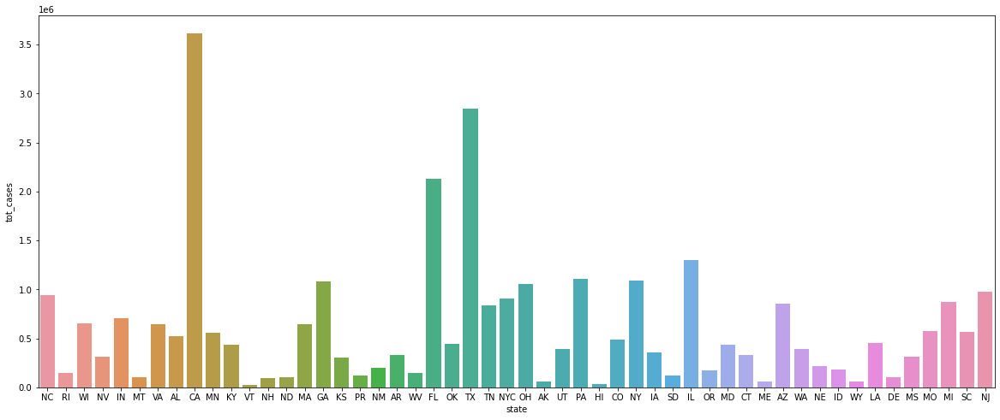

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x= 'state',y='tot_cases',data=cases)

###**Total Deaths**

In [ ]:
for t in range(0,51) :
  print("Total Deaths in "+Total_cases['state'][t]+" are " + str(Total_cases['tot_death'][t]))

Total Deaths in NC are 12387.0
Total Deaths in RI are 2647.0
Total Deaths in WI are 7420.0
Total Deaths in NV are 5365.0
Total Deaths in IN are 13224.0
Total Deaths in MT are 1546.0
Total Deaths in VA are 10595.0
Total Deaths in AL are 10790.0
Total Deaths in CA are 59768.0
Total Deaths in MN are 7098.0
Total Deaths in KY are 6338.0
Total Deaths in VT are 242.0
Total Deaths in NH are 1270.0
Total Deaths in ND are 1479.0
Total Deaths in MA are 17325.0
Total Deaths in GA are 19758.0
Total Deaths in KS are 4953.0
Total Deaths in PR are 2207.0
Total Deaths in NM are 4001.0
Total Deaths in AR are 5694.0
Total Deaths in WV are 2785.0
Total Deaths in FL are 34439.0
Total Deaths in OK are 6719.0
Total Deaths in TX are 48611.0
Total Deaths in TN are 12064.0
Total Deaths in NYC are 32147.0
Total Deaths in OH are 18991.0
Total Deaths in AK are 329.0
Total Deaths in UT are 2164.0
Total Deaths in PA are 25688.0
Total Deaths in HI are 471.0
Total Deaths in CO are 6199.0
Total Deaths in NY are 19179.

In [ ]:
import datetime
cumulative_df = data.groupby(["state", "submission_date"])["tot_cases", "tot_death"].sum().reset_index()
cumulative_df["submission_date"] = pd.to_datetime(cumulative_df["submission_date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="submission_date").reset_index(drop=True)
start_date = datetime.date(2020, 4, 30)
cumulative_df = cumulative_df[cumulative_df["submission_date"]>=start_date]
cumulative_df["submission_date"] = cumulative_df["submission_date"].astype(str)

fig = px.choropleth(locations=cumulative_df["state"],
                    color=cumulative_df["tot_death"], 
                    locationmode="USA-states",
                    scope="usa",
                    animation_frame=cumulative_df["submission_date"],
                    color_continuous_scale='Reds',
                    range_color=[0,60000]
                    #autocolorscale=False,
                   )
layout = go.Layout(
    title=go.layout.Title(
        text="Cumulative count of COVID-19 Deaths in US states",
        x=0.5
    ),
    font=dict(size=14),
)

fig.update_layout(layout)
fig.show()

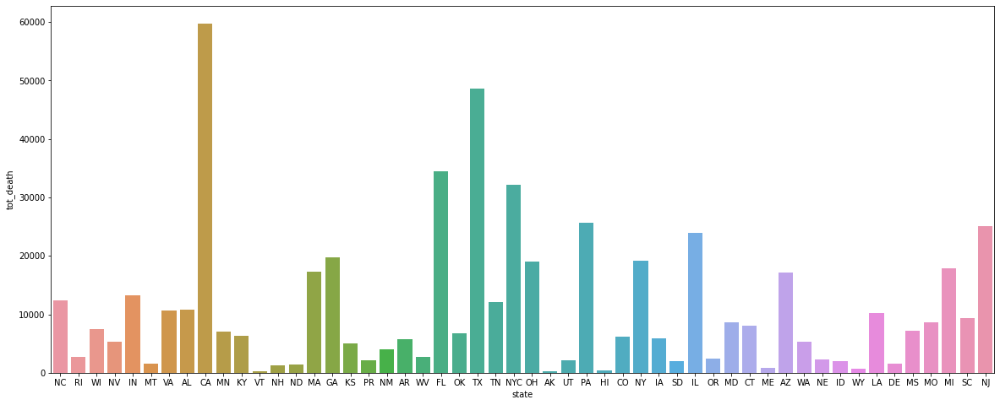

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='tot_death',data=cases)

In [ ]:
#state with highest cases and death in USA

high_cases = cases.sort_values(by = ['tot_cases'],ascending=False)
#display(cases)
print("State with highest covid-19 cases is", high_cases['state'].iloc[0],"with",high_cases['tot_cases'].iloc[0],"cases")

high_cases = cases.sort_values(by= ['tot_death'], ascending=False)
print("State with highest covid-19 deaths is", high_cases['state'].iloc[0],"with",high_cases['tot_death'].iloc[0],"cases")



State with highest covid-19 cases is CA with 3616779.0 cases
State with highest covid-19 deaths is CA with 59768.0 cases


In [ ]:
#state with low cases and deaths in USA
low_cases = cases.sort_values(by = ['tot_cases'],ascending=True)
#display(low_cases)
print("State with lowest covid-19 cases is", low_cases['state'].iloc[0],"with",low_cases['tot_cases'].iloc[0],"cases")

low_cases = cases.sort_values(by=['tot_death'],ascending=True)
print("State with lowest covid-19 cases is", low_cases['state'].iloc[0],"with",low_cases['tot_death'].iloc[0],"cases")

State with lowest covid-19 cases is VT with 22016.0 cases
State with lowest covid-19 cases is VT with 242.0 cases


In [ ]:
cumulative_df = data.groupby(["state", "submission_date"])["tot_cases", "tot_death"].sum().reset_index()
cumulative_df["submission_date"] = pd.to_datetime(cumulative_df["submission_date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="submission_date").reset_index(drop=True)
start_date = datetime.date(2020, 4, 30)
cumulative_df = cumulative_df[cumulative_df["submission_date"]>=start_date]
cumulative_df["submission_date"] = cumulative_df["submission_date"].astype(str)

fig = px.scatter(cumulative_df, x="tot_cases", y="tot_death", animation_frame="submission_date", animation_group="state",
           size="tot_cases", color="state", hover_name="state",
           log_x=False, size_max=55, range_x=[0,3800000], range_y=[0,80000])

layout = go.Layout(
    title=go.layout.Title(
        text="Changes in number of cases & death  over time in US states",
        x=0.5
    ),
    font=dict(size=14),
    xaxis_title = "Total number of  cases",
    yaxis_title = "Total number of death"
)

fig.update_layout(layout)

fig.show()

###**Monthly Cases and Deaths**

In [ ]:
df = pd.DataFrame(data=data)
df['submission_date'] = pd.to_datetime(df["submission_date"].dt.strftime('%Y-%B')) 
display(df)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2021-04-01,RI,138406.0,0.0,0.0,428.0,0.0,2627.0,0.0,0.0,2.0,0.0,04/02/2021 01:56:15 PM,Not agree,Neutral
2,2021-03-01,MN,498926.0,0.0,0.0,708.0,152.0,6817.0,6380.0,437.0,2.0,0.0,03/17/2021 02:24:24 PM,Neutral,Agree
3,2021-02-01,MO,533260.0,0.0,0.0,1393.0,481.0,7117.0,0.0,0.0,0.0,0.0,02/05/2021 04:54:00 AM,Not agree,Not agree
4,2021-04-01,CT,329062.0,302775.0,26287.0,1062.0,208.0,7995.0,6578.0,1417.0,5.0,1.0,04/17/2021 01:58:33 PM,Agree,Agree
7,2020-02-01,WA,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Neutral,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27173,2021-02-01,AZ,807967.0,753580.0,54387.0,1804.0,175.0,15505.0,13694.0,1811.0,25.0,5.0,02/22/2021 02:53:38 PM,Agree,Agree
27174,2020-09-01,OR,28044.0,26737.0,1307.0,188.0,0.0,481.0,469.0,12.0,1.0,0.0,09/07/2020 01:37:36 PM,Agree,Agree
27175,2021-01-01,AZ,738561.0,692499.0,46062.0,5918.0,1175.0,12643.0,11292.0,1351.0,195.0,20.0,01/28/2021 02:49:07 PM,Agree,Agree
27178,2020-03-01,MI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Agree,Agree


In [ ]:
first_case = df.loc[(df['tot_cases']>=1)]
display(first_case.sort_values(by=['submission_date'],ascending=True))


,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
7654,2020-01-01,IL,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Agree,Agree
1489,2020-01-01,IL,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Agree,Agree
21578,2020-01-01,WA,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Neutral,Neutral
965,2020-01-01,WA,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Neutral,Neutral
24673,2020-01-01,WA,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,03/26/2020 04:22:39 PM,Neutral,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17736,2021-04-01,KS,303227.0,245180.0,58047.0,354.0,90.0,4927.0,0.0,0.0,-5.0,0.0,04/06/2021 01:43:58 PM,Agree,Neutral
17735,2021-04-01,NY,1069399.0,0.0,0.0,3514.0,0.0,19032.0,0.0,0.0,22.0,0.0,04/12/2021 01:39:29 PM,Not agree,Not agree
17732,2021-04-01,CO,474053.0,444367.0,29686.0,1886.0,159.0,6143.0,5410.0,733.0,4.0,0.0,04/09/2021 02:11:49 PM,Agree,Agree
13582,2021-04-01,HI,29984.0,0.0,0.0,67.0,0.0,470.0,0.0,0.0,2.0,0.0,04/15/2021 01:58:27 PM,Not agree,Not agree


Total cases in Jan 2020 : 7.0
Total cases in Feb 2020 : 47.0
Total cases in Mar 2020 : 187540.0
Total cases in April 2020 : 871996.0
Total cases in May 2020 : 720660.0
Total cases in June 2020 : 846174.0
Total cases in July 2020 : 1922181.0
Total cases in Aug 2020 : 1466528.0
Total cases in Sep 2020 : 1214790.0
Total cases in Oct 2020 : 1923883.0
Total cases in Nov 2020 : 4393624.0
Total cases in Dec 2020 : 6387454.0
Total cases in Jan 2021 : 6090193.0
Total cases in Feb 2021 : 2350448.0
Total cases in Mar 2021 : 1769461.0
Total cases in April 2021 : 1194888.0


[Text(0, 0, 'Jan 2020'),
 Text(0, 0, 'Feb 2020'),
 Text(0, 0, 'Mar 2020'),
 Text(0, 0, 'Apr 2020'),
 Text(0, 0, 'May 2020'),
 Text(0, 0, 'Jun 2020'),
 Text(0, 0, 'Jul 2020'),
 Text(0, 0, 'Aug 2020'),
 Text(0, 0, 'Sep 2020'),
 Text(0, 0, 'Oct 2020'),
 Text(0, 0, 'Nov 2020'),
 Text(0, 0, 'Dec 2020'),
 Text(0, 0, 'Jan 2021'),
 Text(0, 0, 'Feb 2021'),
 Text(0, 0, 'Mar 2021'),
 Text(0, 0, 'April 2021')]

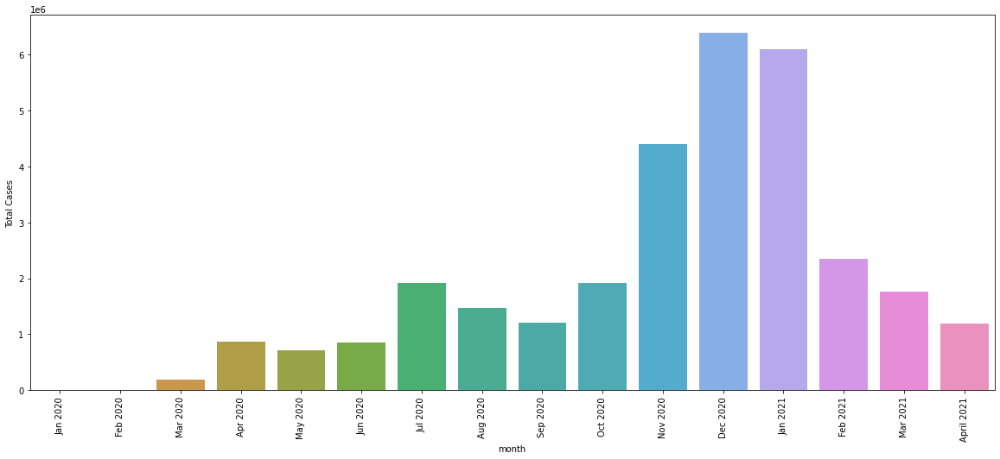

In [ ]:
#Monthly cases in USA

monthly_cases = first_case.loc[(df['submission_date'] =='2020-01-01')]
print("Total cases in Jan 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Jan 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df = pd.DataFrame(data=d)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-02-01')]
print("Total cases in Feb 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Feb 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-03-01')]
print("Total cases in Mar 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Mar 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-04-01')]
print("Total cases in April 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Apr 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-05-01')]
print("Total cases in May 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['May 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-06-01')]
print("Total cases in June 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Jun 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-07-01')]
print("Total cases in July 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Jul 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-08-01')]
print("Total cases in Aug 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Aug 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-09-01')]
print("Total cases in Sep 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Sep 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-10-01')]
print("Total cases in Oct 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Oct 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-11-01')]
print("Total cases in Nov 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Nov 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2020-12-01')]
print("Total cases in Dec 2020 :",monthly_cases['new_case'].sum())
d = {'month': ['Dec 2020'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-01-01')]
print("Total cases in Jan 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['Jan 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-02-01')]
print("Total cases in Feb 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['Feb 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-03-01')]
print("Total cases in Mar 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['Mar 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_cases = first_case.loc[(df['submission_date'] =='2021-04-01')]
print("Total cases in April 2021 :",monthly_cases['new_case'].sum())
d = {'month': ['April 2021'], 'Total Cases': [monthly_cases['new_case'].sum()]}
total_cases_df=total_cases_df.append(pd.DataFrame(data=d), ignore_index=True)

plt.figure(figsize=(20,8))
p = sns.barplot(y='Total Cases' , x='month', data=total_cases_df )
#x_dates = first_case['submission_date'].dt.strftime('%Y-%m-%d').sort_values().unique()
p.set_xticklabels(p.get_xticklabels(),rotation=90)


Total deaths in Jan 2020 : 0.0
Total deaths in Feb 2020 : 1.0
Total deaths in Mar 2020 : 3669.0
Total deaths in April 2020 : 54783.0
Total deaths in May 2020 : 41809.0
Total deaths in June 2020 : 21550.0
Total deaths in July 2020 : 28213.0
Total deaths in Aug 2020 : 29147.0
Total deaths in Sep 2020 : 22266.0
Total deaths in Oct 2020 : 23962.0
Total deaths in Nov 2020 : 39328.0
Total deaths in Dec 2020 : 79074.0
Total deaths in Jan 2021 : 96956.0
Total deaths in Feb 2021 : 63322.0
Total deaths in Mar 2021 : 32986.0
Total deaths in April 2021 : 12187.0


[Text(0, 0, 'Jan 2020'),
 Text(0, 0, 'Feb 2020'),
 Text(0, 0, 'Mar 2020'),
 Text(0, 0, 'Apr 2020'),
 Text(0, 0, 'May 2020'),
 Text(0, 0, 'Jun 2020'),
 Text(0, 0, 'Jul 2020'),
 Text(0, 0, 'Aug 2020'),
 Text(0, 0, 'Sep 2020'),
 Text(0, 0, 'Oct 2020'),
 Text(0, 0, 'Nov 2020'),
 Text(0, 0, 'Dec 2020'),
 Text(0, 0, 'Jan 2021'),
 Text(0, 0, 'Feb 2021'),
 Text(0, 0, 'Mar 2021'),
 Text(0, 0, 'April 2021')]

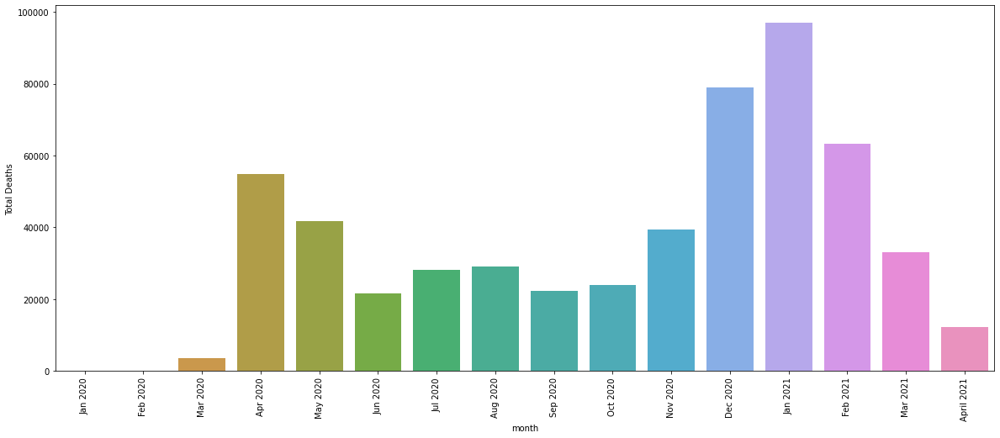

In [ ]:
#Monthly deaths in USA
monthly_deaths = first_case.loc[(df['submission_date'] =='2020-01-01')]
print("Total deaths in Jan 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jan 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df = pd.DataFrame(data=d)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-02-01')]
print("Total deaths in Feb 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Feb 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-03-01')]
print("Total deaths in Mar 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Mar 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-04-01')]
print("Total deaths in April 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Apr 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-05-01')]
print("Total deaths in May 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['May 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-06-01')]
print("Total deaths in June 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jun 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-07-01')]
print("Total deaths in July 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jul 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-08-01')]
print("Total deaths in Aug 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Aug 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-09-01')]
print("Total deaths in Sep 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Sep 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-10-01')]
print("Total deaths in Oct 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Oct 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-11-01')]
print("Total deaths in Nov 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Nov 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2020-12-01')]
print("Total deaths in Dec 2020 :",monthly_deaths['new_death'].sum())
d = {'month': ['Dec 2020'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-01-01')]
print("Total deaths in Jan 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['Jan 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-02-01')]
print("Total deaths in Feb 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['Feb 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-03-01')]
print("Total deaths in Mar 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['Mar 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

monthly_deaths = first_case.loc[(df['submission_date'] =='2021-04-01')]
print("Total deaths in April 2021 :",monthly_deaths['new_death'].sum())
d = {'month': ['April 2021'], 'Total Deaths': [monthly_deaths['new_death'].sum()]}
total_deaths_df=total_deaths_df.append(pd.DataFrame(data=d), ignore_index=True)

plt.figure(figsize=(20,8))
p = sns.barplot(y='Total Deaths' , x='month', data=total_deaths_df )
#x_dates = first_case['submission_date'].dt.strftime('%Y-%m-%d').sort_values().unique()
p.set_xticklabels(p.get_xticklabels(),rotation=90)

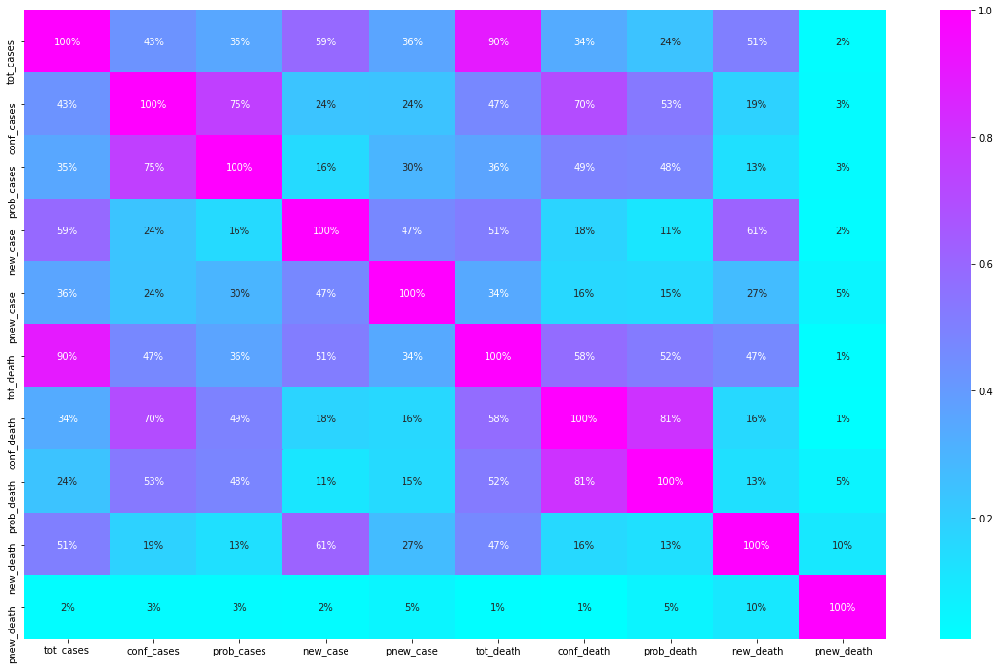

In [ ]:
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(),annot=True, fmt='.0%',cmap='cool')
plt.show()

# **Probable  and Confirmed Cases**

**Aprobable case or death is defined as any one of the following:**

**Meets clinical criteria AND epidemiologic linkage with no confirmatory laboratory testing performed for SARS-CoV-2.** 

**Meets presumptive laboratory evidence.**

**Meets vital records criteria with no confirmatory laboratory evidence for SARS-CoV-2.** 

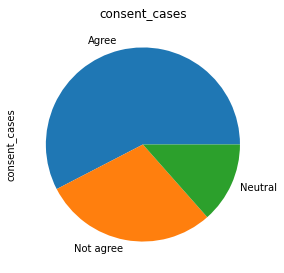

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(141)
plt.title('consent_cases')
df['consent_cases'].value_counts().plot.pie()

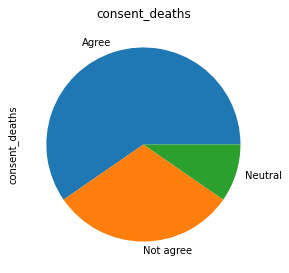

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(141)
plt.title('consent_deaths')
df['consent_deaths'].value_counts().plot.pie()

###**Probable Cases**

In [ ]:
probable_cases = cases.loc[(df['consent_cases'] =='Agree')]
display(probable_cases.dropna().reset_index(drop = True))
updated=probable_cases.dropna().reset_index(drop = True)


,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2021-04-18,NC,943693.0,811179.0,132514.0,0.0,0.0,12387.0,10924.0,1463.0,0.0,0.0,04/19/2021 03:04:26 PM,Agree,Agree
1,2021-04-18,WI,651545.0,590458.0,61087.0,596.0,78.0,7420.0,6709.0,711.0,-2.0,0.0,04/19/2021 03:04:26 PM,Agree,Agree
2,2021-04-18,MT,107145.0,98913.0,8232.0,56.0,11.0,1546.0,1546.0,0.0,1.0,0.0,04/19/2021 03:04:26 PM,Agree,Agree
3,2021-04-18,VA,647111.0,503725.0,143386.0,978.0,296.0,10595.0,8893.0,1702.0,14.0,3.0,04/19/2021 03:04:26 PM,Agree,Agree
4,2021-04-18,AL,522401.0,405385.0,117016.0,270.0,77.0,10790.0,8498.0,2292.0,0.0,0.0,04/19/2021 03:04:26 PM,Agree,Agree
5,2021-04-18,KY,437312.0,331407.0,105905.0,275.0,89.0,6338.0,5730.0,608.0,4.0,0.0,04/19/2021 03:04:26 PM,Agree,Agree
6,2021-04-18,ND,105805.0,98320.0,7485.0,51.0,18.0,1479.0,0.0,0.0,0.0,0.0,04/19/2021 03:04:26 PM,Agree,Not agree
7,2021-04-18,MA,641367.0,631471.0,9896.0,1265.0,0.0,17325.0,17117.0,208.0,7.0,0.0,04/19/2021 03:04:26 PM,Agree,Agree
8,2021-04-18,GA,1084272.0,868865.0,215407.0,972.0,270.0,19758.0,17214.0,2544.0,1.0,1.0,04/19/2021 03:04:26 PM,Agree,Agree
9,2021-04-18,KS,305861.0,247291.0,58570.0,0.0,0.0,4953.0,0.0,0.0,0.0,0.0,04/19/2021 03:04:26 PM,Agree,Neutral


In [ ]:
for i in range(0,30) :
   print("Total Number of Probable Cases in "+updated['state'][i]+" are " + str(updated['prob_cases'][i]))

Total Number of Probable Cases in NC are 132514.0
Total Number of Probable Cases in WI are 61087.0
Total Number of Probable Cases in MT are 8232.0
Total Number of Probable Cases in VA are 143386.0
Total Number of Probable Cases in AL are 117016.0
Total Number of Probable Cases in KY are 105905.0
Total Number of Probable Cases in ND are 7485.0
Total Number of Probable Cases in MA are 9896.0
Total Number of Probable Cases in GA are 215407.0
Total Number of Probable Cases in KS are 58570.0
Total Number of Probable Cases in PR are 14185.0
Total Number of Probable Cases in WV are 31444.0
Total Number of Probable Cases in OK are 93984.0
Total Number of Probable Cases in TN are 143669.0
Total Number of Probable Cases in NYC are 157438.0
Total Number of Probable Cases in OH are 165485.0
Total Number of Probable Cases in UT are 0.0
Total Number of Probable Cases in PA are 171675.0
Total Number of Probable Cases in CO are 31017.0
Total Number of Probable Cases in IL are 0.0
Total Number of Proba

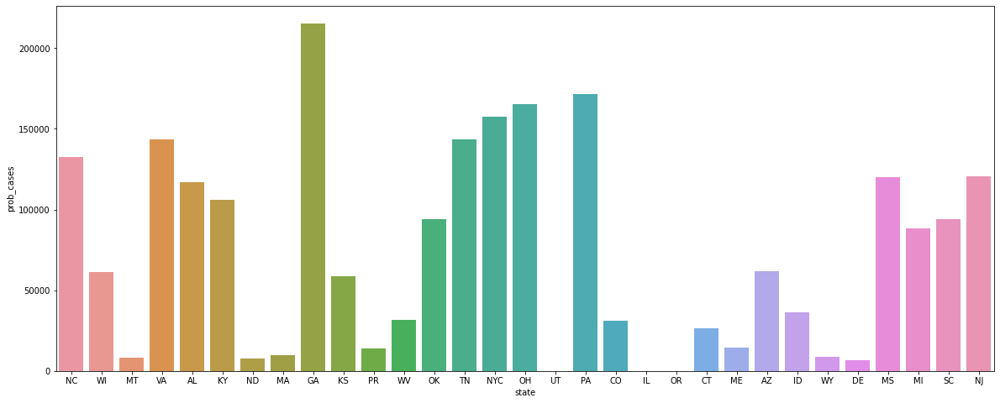

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='prob_cases',data=updated)

###**confirmed Cases**

In [ ]:
for i in range(0,30) :
   print("Total Number of Confirmed Cases in "+updated['state'][i]+" are " + str(updated['conf_cases'][i]))

Total Number of Confirmed Cases in NC are 811179.0
Total Number of Confirmed Cases in WI are 590458.0
Total Number of Confirmed Cases in MT are 98913.0
Total Number of Confirmed Cases in VA are 503725.0
Total Number of Confirmed Cases in AL are 405385.0
Total Number of Confirmed Cases in KY are 331407.0
Total Number of Confirmed Cases in ND are 98320.0
Total Number of Confirmed Cases in MA are 631471.0
Total Number of Confirmed Cases in GA are 868865.0
Total Number of Confirmed Cases in KS are 247291.0
Total Number of Confirmed Cases in PR are 108864.0
Total Number of Confirmed Cases in WV are 117443.0
Total Number of Confirmed Cases in OK are 351665.0
Total Number of Confirmed Cases in TN are 691703.0
Total Number of Confirmed Cases in NYC are 749952.0
Total Number of Confirmed Cases in OH are 887690.0
Total Number of Confirmed Cases in UT are 392757.0
Total Number of Confirmed Cases in PA are 935702.0
Total Number of Confirmed Cases in CO are 459272.0
Total Number of Confirmed Cases 

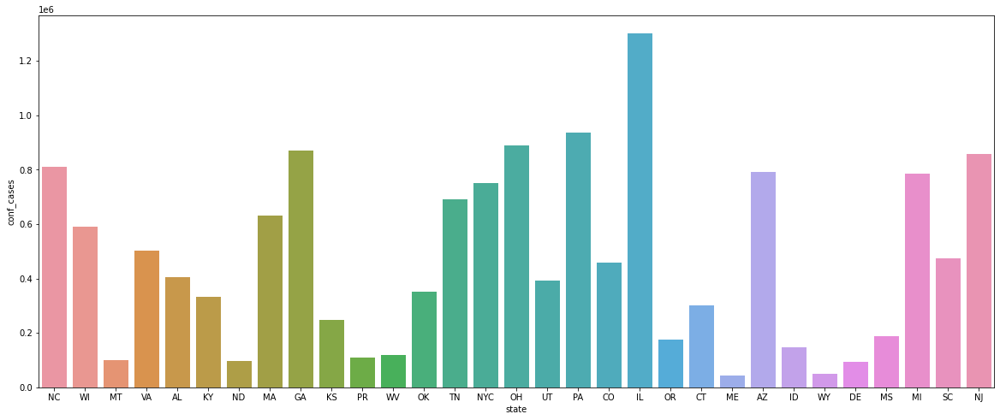

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='conf_cases',data=updated)

# **Probable and Confirmed Deaths**

###**probable deaths**


In [ ]:
probabledeath = cases.loc[(df['consent_deaths'] =='Agree')]
#display(probabledeath.dropna().reset_index(drop = True))
probable_death=probabledeath.dropna().reset_index(drop = True)
for i in range(0,30) :
   print("Total Number of Probable Deaths in "+probable_death['state'][i]+" are " + str(probable_death['prob_death'][i]))

Total Number of Probable Deaths in NC are 1463.0
Total Number of Probable Deaths in WI are 711.0
Total Number of Probable Deaths in IN are 409.0
Total Number of Probable Deaths in MT are 0.0
Total Number of Probable Deaths in VA are 1702.0
Total Number of Probable Deaths in AL are 2292.0
Total Number of Probable Deaths in MN are 464.0
Total Number of Probable Deaths in KY are 608.0
Total Number of Probable Deaths in MA are 208.0
Total Number of Probable Deaths in GA are 2544.0
Total Number of Probable Deaths in PR are 322.0
Total Number of Probable Deaths in OK are 1029.0
Total Number of Probable Deaths in TN are 2381.0
Total Number of Probable Deaths in NYC are 5073.0
Total Number of Probable Deaths in OH are 0.0
Total Number of Probable Deaths in UT are 61.0
Total Number of Probable Deaths in CO are 737.0
Total Number of Probable Deaths in SD are 364.0
Total Number of Probable Deaths in IL are 2292.0
Total Number of Probable Deaths in OR are 0.0
Total Number of Probable Deaths in MD 

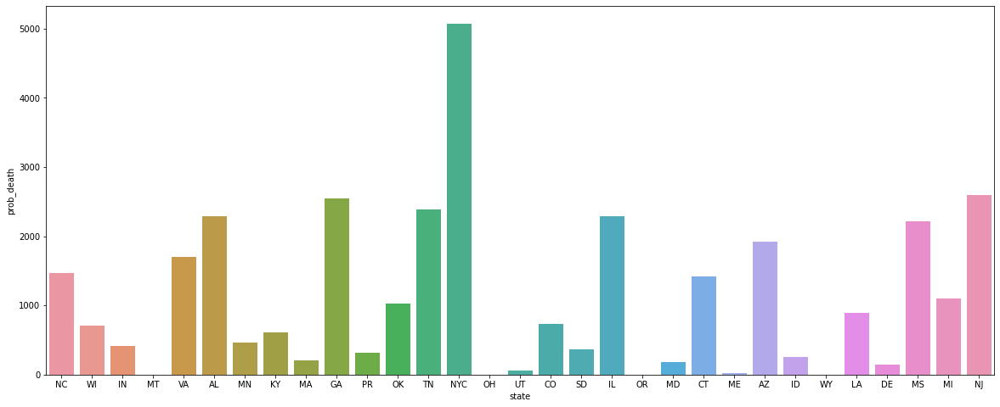

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='prob_death',data=probable_death)

###**Confirmed Deaths**

In [ ]:
for i in range(0,30) :
   print("Total Number of Confirm Deaths in "+probable_death['state'][i]+" are " + str(probable_death['conf_death'][i]))

Total Number of Confirm Deaths in NC are 10924.0
Total Number of Confirm Deaths in WI are 6709.0
Total Number of Confirm Deaths in IN are 12815.0
Total Number of Confirm Deaths in MT are 1546.0
Total Number of Confirm Deaths in VA are 8893.0
Total Number of Confirm Deaths in AL are 8498.0
Total Number of Confirm Deaths in MN are 6634.0
Total Number of Confirm Deaths in KY are 5730.0
Total Number of Confirm Deaths in MA are 17117.0
Total Number of Confirm Deaths in GA are 17214.0
Total Number of Confirm Deaths in PR are 1885.0
Total Number of Confirm Deaths in OK are 5690.0
Total Number of Confirm Deaths in TN are 9683.0
Total Number of Confirm Deaths in NYC are 27074.0
Total Number of Confirm Deaths in OH are 18991.0
Total Number of Confirm Deaths in UT are 2103.0
Total Number of Confirm Deaths in CO are 5462.0
Total Number of Confirm Deaths in SD are 1589.0
Total Number of Confirm Deaths in IL are 21663.0
Total Number of Confirm Deaths in OR are 2460.0
Total Number of Confirm Deaths i

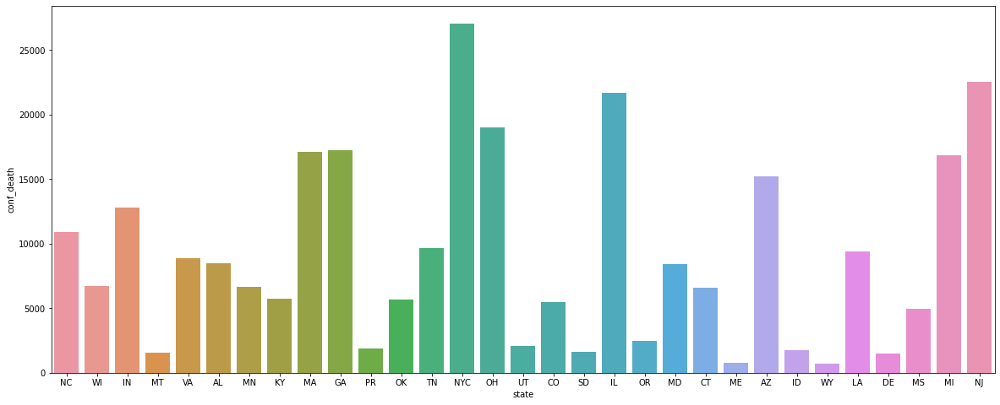

In [ ]:
plt.figure(figsize=(20,8))
sns.barplot(x='state',y='conf_death',data=probable_death)

#**Total and Average Recovery Cases of Covid_19 in USA**

In [ ]:
# convert objects to float
data["tot_cases"] =  data.tot_cases.astype(float)
data["tot_death"] = data.tot_death.astype(float)
data = data[["submission_date", "state", "tot_cases", "tot_death"]]
state_df = data.groupby('state').mean().reset_index()
state_df.tail()
data["Total_recovered"] = data.tot_cases - data.tot_death
data.tail()


,submission_date,state,tot_cases,tot_death,Total_recovered
27294,2020-08-03,ND,6933.0,107.0,6826.0
27296,2020-07-21,MO,45475.0,1143.0,44332.0
27297,2021-02-24,AL,490220.0,9744.0,480476.0
27298,2020-05-17,MN,16372.0,739.0,15633.0
27299,2020-07-20,NH,6249.0,398.0,5851.0


In [ ]:
# groupby date and state and take the mean value to get monthly average..
covid_monthly_df = round(data.groupby(["submission_date", "state"]).mean().reset_index(), 2)
covid_monthly_df.tail()

,submission_date,state,tot_cases,tot_death,Total_recovered
23655,2021-04-20,VT,22165.0,242.0,21923.0
23656,2021-04-20,WA,388718.0,5407.0,383311.0
23657,2021-04-20,WI,652879.0,7427.0,645452.0
23658,2021-04-20,WV,149462.0,2789.0,146673.0
23659,2021-04-20,WY,57456.0,705.0,56751.0


In [ ]:
# rename columns. name gotta be compatable wth sqlite database naming potocol.
covid_monthly_df = covid_monthly_df.rename(columns={"date": "Date", "state": "State", "tot_cases": "Average_cases", "tot_death": "Average_death", "Total_recovered": "Average_recovery"})
covid_monthly_df

,submission_date,State,Average_cases,Average_death,Average_recovery
0,2020-01-22,AK,0.0,0.0,0.0
1,2020-01-22,AL,0.0,0.0,0.0
2,2020-01-22,AR,0.0,0.0,0.0
3,2020-01-22,AZ,0.0,0.0,0.0
4,2020-01-22,CA,0.0,0.0,0.0
...,...,...,...,...,...
23655,2021-04-20,VT,22165.0,242.0,21923.0
23656,2021-04-20,WA,388718.0,5407.0,383311.0
23657,2021-04-20,WI,652879.0,7427.0,645452.0
23658,2021-04-20,WV,149462.0,2789.0,146673.0


In [ ]:
# add death and recovery percentage columns. change NA values to zero
covid_monthly_df['Death_percent'] = round((covid_monthly_df.Average_death/covid_monthly_df.Average_cases)*100, 2)
covid_monthly_df['Recovery_percent'] = round((covid_monthly_df.Average_recovery/covid_monthly_df.Average_cases)*100, 2)
covid_monthly_df=covid_monthly_df.fillna(0)
covid_monthly_df

,submission_date,State,Average_cases,Average_death,Average_recovery,Death_percent,Recovery_percent
0,2020-01-22,AK,0.0,0.0,0.0,0.00,0.00
1,2020-01-22,AL,0.0,0.0,0.0,0.00,0.00
2,2020-01-22,AR,0.0,0.0,0.0,0.00,0.00
3,2020-01-22,AZ,0.0,0.0,0.0,0.00,0.00
4,2020-01-22,CA,0.0,0.0,0.0,0.00,0.00
...,...,...,...,...,...,...,...
23655,2021-04-20,VT,22165.0,242.0,21923.0,1.09,98.91
23656,2021-04-20,WA,388718.0,5407.0,383311.0,1.39,98.61
23657,2021-04-20,WI,652879.0,7427.0,645452.0,1.14,98.86
23658,2021-04-20,WV,149462.0,2789.0,146673.0,1.87,98.13


#**Prediction of Covid_19 Cases and Deaths in  USA**

##**Cases Prediction**

In [ ]:
pip install pmdarima

     |████████████████████████████████| 1.5MB 5.3MB/s 
     |████████████████████████████████| 9.5MB 16.6MB/s 
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
from fbprophet import Prophet
confirmed = data.groupby(['state','submission_date']).sum()['conf_cases'].reset_index()
deaths = data.groupby(['state','submission_date']).sum()['conf_death'].reset_index()

In [ ]:
# Create a common model for all cases.
def prediction(pred,x):
  m = Prophet(interval_width=0.95) 
  m.fit(pred) 
  future = m.make_future_dataframe(periods=x) 
  forecast = m.predict(future)
  confirmed_forecast_plot = m.plot(forecast)
  confirmed_forecast_plot =m.plot_components(forecast)
  return forecast

In [ ]:
confirmed.columns = ['state','ds','y']
confirmed['ds'] = pd.to_datetime(confirmed['ds'])
confirmed.tail()

,state,ds,y
23550,WY,2021-04-14,48333.0
23551,WY,2021-04-15,48394.0
23552,WY,2021-04-16,48447.0
23553,WY,2021-04-17,48447.0
23554,WY,2021-04-18,48447.0


###**Next 1 months New_cases prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


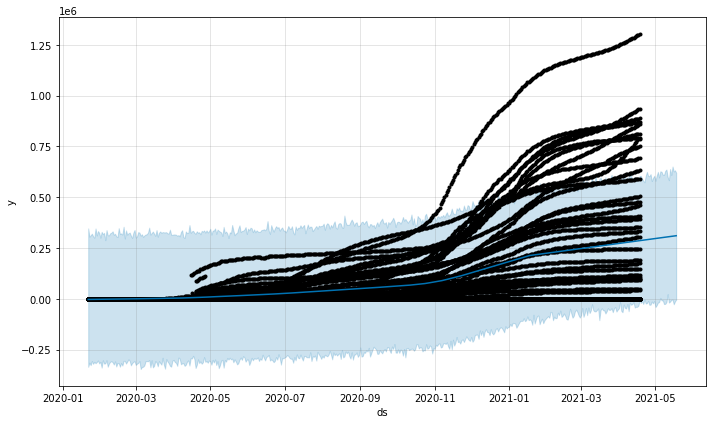

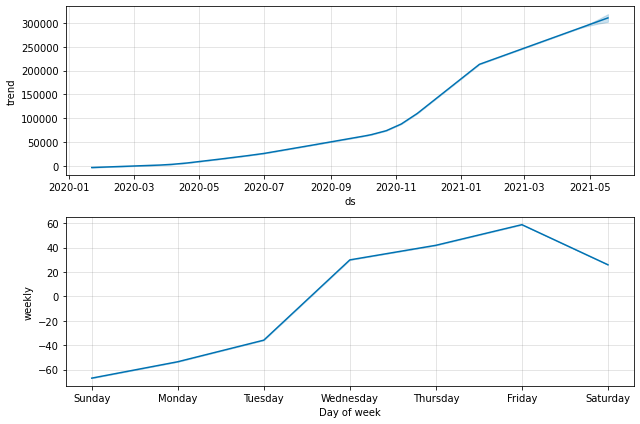

In [ ]:
f=prediction(confirmed,30)

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_cases","yhat_lower": "new_cases_min", "yhat_upper": "new_cases_max"},inplace=True)
f[['date', 'new_cases', 'new_cases_min', 'new_cases_max']].tail(10)

,date,new_cases,new_cases_min,new_cases_max
473,2021-05-09,303116.068255,-24903.285529,629796.983846
474,2021-05-10,303940.094463,-16348.397655,636280.544850
475,2021-05-11,304768.384099,22922.097366,599543.879254
476,2021-05-12,305644.700863,-18699.093162,583689.791474
477,2021-05-13,306467.255027,-13716.160977,638769.761580
478,2021-05-14,307294.759976,-5226.534432,609163.303727
479,2021-05-15,308072.576151,-3836.543881,651004.539328
480,2021-05-16,308790.384776,-27030.424136,626662.197782
481,2021-05-17,309614.410984,-12598.694326,632445.909490
482,2021-05-18,310442.700620,-3748.442242,620366.290690


###**Next 3 months New_cases prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


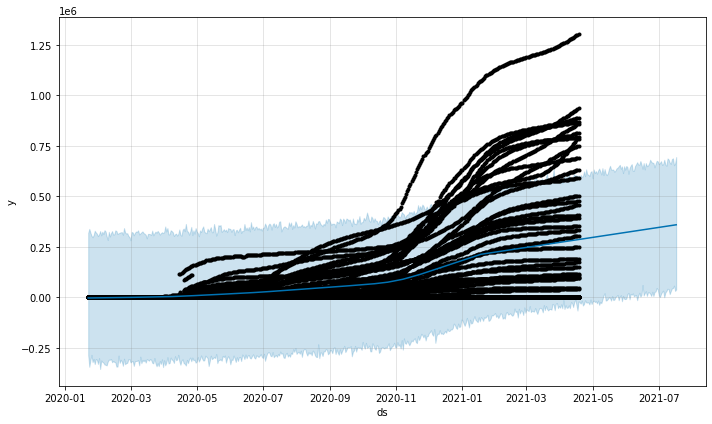

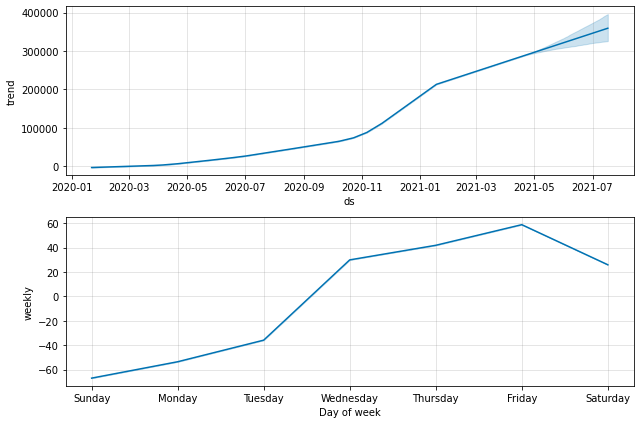

In [ ]:
f=prediction(confirmed,90)

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_cases","yhat_lower": "new_cases_min", "yhat_upper": "new_cases_max"},inplace=True)
f[['date', 'new_cases', 'new_cases_min', 'new_cases_max']].tail(10)

,date,new_cases,new_cases_min,new_cases_max
533,2021-07-08,351861.787196,31220.630838,650992.928949
534,2021-07-09,352689.292145,42518.123346,687476.419627
535,2021-07-10,353467.108321,40854.423455,682373.076694
536,2021-07-11,354184.916946,16193.742416,667493.575027
537,2021-07-12,355008.943154,30853.005195,660245.860397
538,2021-07-13,355837.232790,43872.755967,683683.151257
539,2021-07-14,356713.549554,45686.619503,688007.597296
540,2021-07-15,357536.103718,58090.044160,653610.317203
541,2021-07-16,358363.608667,31736.467273,662733.436356
542,2021-07-17,359141.424842,39664.169132,694472.724443


###**Next 6 months New_case prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


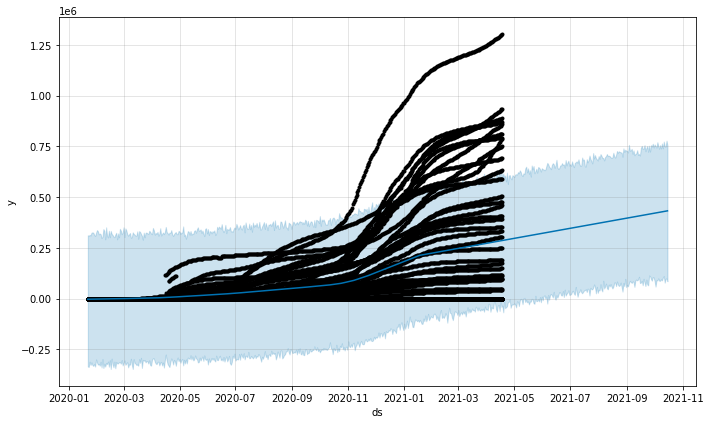

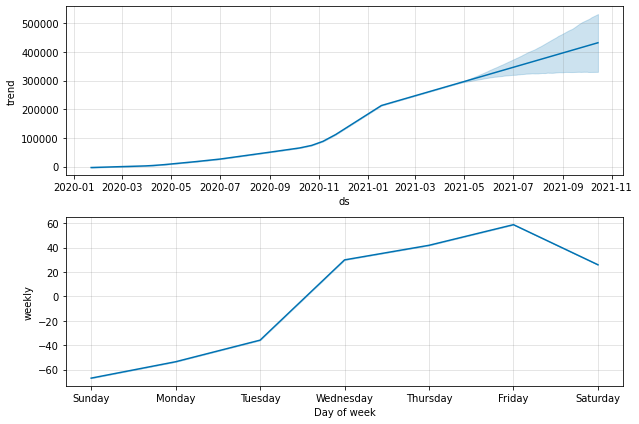

In [ ]:
f=prediction(confirmed,180)

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_cases","yhat_lower": "new_cases_min", "yhat_upper": "new_cases_max"},inplace=True)
f[['date', 'new_cases', 'new_cases_min', 'new_cases_max']].tail(10)

,date,new_cases,new_cases_min,new_cases_max
623,2021-10-06,424805.347809,87602.598439,737996.497142
624,2021-10-07,425627.901972,87647.471325,755610.145291
625,2021-10-08,426455.406921,94959.119514,739225.537983
626,2021-10-09,427233.223097,89624.720481,763981.820525
627,2021-10-10,427951.031721,103165.309697,739799.042307
628,2021-10-11,428775.057930,110950.007546,773304.868645
629,2021-10-12,429603.347566,78463.968697,749516.381898
630,2021-10-13,430479.664330,97732.937204,748728.580546
631,2021-10-14,431302.218493,98617.072738,777830.532070
632,2021-10-15,432129.723442,85640.620702,754251.446027


##**Deaths Prediction**

###**Next 1 months New_deaths prediction of COVID_19 in USA**

In [ ]:
deaths.columns = ['state','ds','y']
deaths['ds'] = pd.to_datetime(deaths['ds'])
deaths.tail()

,state,ds,y
23550,WY,2021-04-14,703.0
23551,WY,2021-04-15,703.0
23552,WY,2021-04-16,703.0
23553,WY,2021-04-17,703.0
23554,WY,2021-04-18,703.0


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


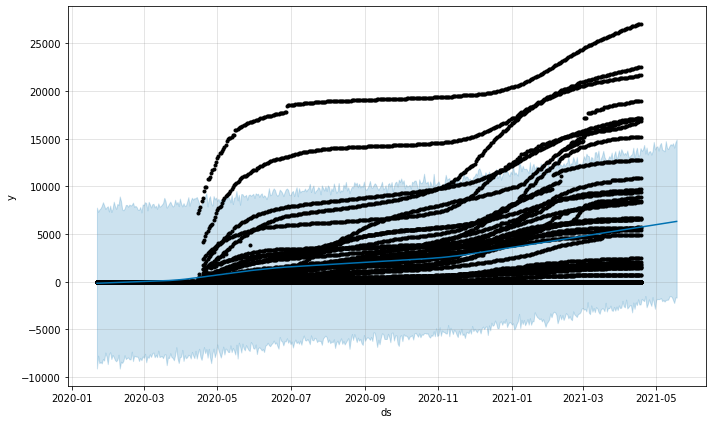

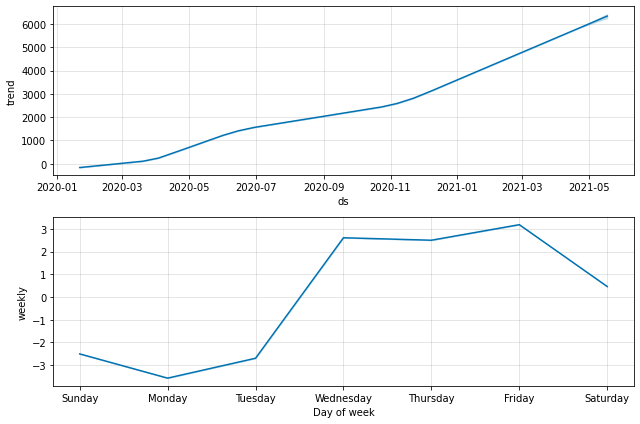

In [ ]:
f=prediction(deaths,30)

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_death","yhat_lower": "new_death_min", "yhat_upper": "new_death_max"},inplace=True)
f[['date', 'new_death', 'new_death_min', 'new_death_max']].tail(10)

,date,new_death,new_death_min,new_death_max
473,2021-05-09,6150.101714,-1907.781122,14749.957109
474,2021-05-10,6168.997388,-1890.436192,14032.140735
475,2021-05-11,6189.835832,-1871.368312,13915.583284
476,2021-05-12,6215.102366,-1535.670912,14226.033386
477,2021-05-13,6234.956291,-1507.140435,14436.255748
478,2021-05-14,6255.603415,-1588.889248,14301.826727
479,2021-05-15,6272.842723,-1912.632521,14526.573362
480,2021-05-16,6289.839626,-2228.172961,14066.498739
481,2021-05-17,6308.735300,-1638.244194,14612.280782
482,2021-05-18,6329.573744,-1662.080993,14917.507646


###**Next 3 months New_deaths prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


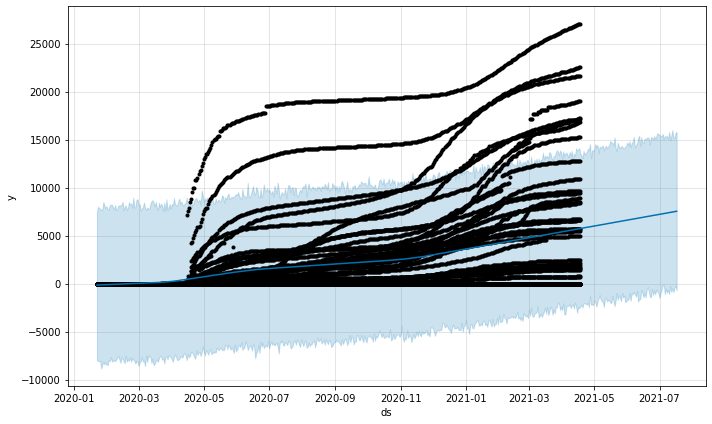

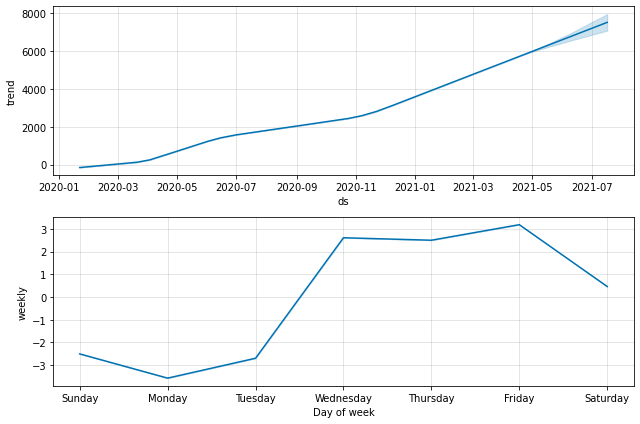

In [ ]:
f=prediction(deaths,90)

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_death","yhat_lower": "new_death_min", "yhat_upper": "new_death_max"},inplace=True)
f[['date', 'new_death', 'new_death_min', 'new_death_max']].tail(10)

,date,new_death,new_death_min,new_death_max
533,2021-07-08,7352.859586,-951.894412,15352.392045
534,2021-07-09,7373.506710,-657.352406,15059.386343
535,2021-07-10,7390.746019,-1076.570405,15805.286785
536,2021-07-11,7407.742921,-271.601110,14927.239120
537,2021-07-12,7426.638595,-856.077964,15395.312159
538,2021-07-13,7447.477039,-507.446395,15979.858260
539,2021-07-14,7472.743573,-892.669247,15223.159646
540,2021-07-15,7492.597498,-422.009561,15160.175435
541,2021-07-16,7513.244622,-252.705834,15695.678302
542,2021-07-17,7530.483931,-703.415977,15800.818586


###**Next 6 months New_deaths prediction of COVID_19 in USA**

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


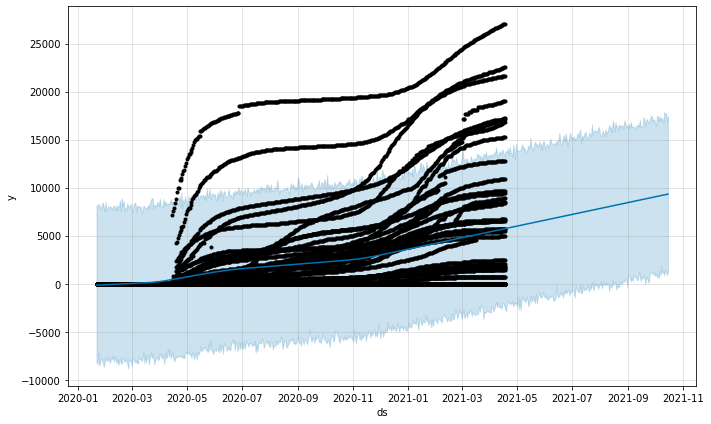

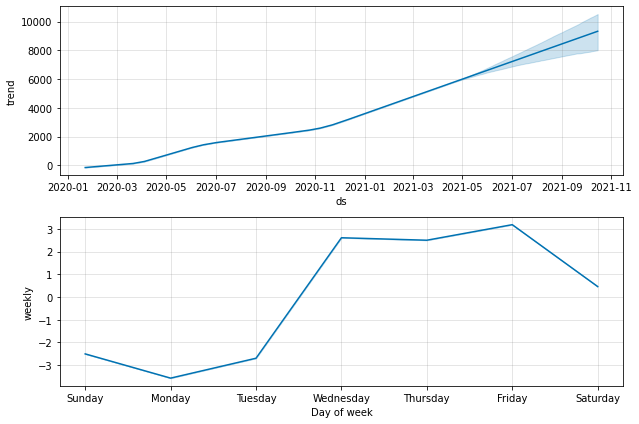

In [ ]:
f=prediction(deaths,180)

In [ ]:
f.rename(columns={"ds": "date", "yhat": "new_death","yhat_lower": "new_death_min", "yhat_upper": "new_death_max"},inplace=True)
f[['date', 'new_death', 'new_death_min', 'new_death_max']].tail(10)

,date,new_death,new_death_min,new_death_max
623,2021-10-06,9149.598516,1383.584514,17451.216513
624,2021-10-07,9169.452441,913.765061,16939.927451
625,2021-10-08,9190.099565,1782.972483,17281.113813
626,2021-10-09,9207.338873,1081.786224,17104.557931
627,2021-10-10,9224.335776,1331.750518,16775.217643
628,2021-10-11,9243.231450,885.524478,17885.115670
629,2021-10-12,9264.069894,1437.524521,17662.379365
630,2021-10-13,9289.336428,1288.362802,17760.743253
631,2021-10-14,9309.190353,923.210497,16951.344629
632,2021-10-15,9329.837476,1179.615629,17467.339159


#**Demographics for COVID-19**

In [ ]:
import pandas as pd
df2 = pd.read_csv('https://data.cdc.gov/api/views/vbim-akqf/rows.csv?accessType=DOWNLOAD',",") 
pd.set_option('display.max_columns',None)
#print(dataset.columns.to_list(),'\n')
display(df2)

,cdc_case_earliest_dt,cdc_report_dt,pos_spec_dt,onset_dt,current_status,sex,age_group,race_ethnicity_combined,hosp_yn,icu_yn,death_yn,medcond_yn
0,2020/10/23,2021/01/28,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",Missing,Missing,No,Missing
1,2020/10/23,2020/10/23,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Unknown,No,No
2,2020/10/23,2020/10/25,2020/10/23,2020/10/23,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,Missing,Missing
3,2020/10/23,2020/10/25,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",Missing,Missing,Missing,Missing
4,2020/10/23,2020/10/26,2020/10/23,NaN,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,No,Missing
...,...,...,...,...,...,...,...,...,...,...,...,...
22507134,2020/10/26,2020/12/12,2020/10/29,2020/10/26,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,No,Missing,Missing,No
22507135,2020/10/29,2020/11/01,2020/10/29,NaN,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,No,No,No
22507136,2020/10/28,2021/02/10,2020/10/29,2020/10/28,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,No,Missing,No,No
22507137,2020/10/29,2020/10/30,2020/10/29,2020/10/29,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,No,No,No,Missing


###**About the dataset features:**

**cdc_case_earliest_dt :** The earlier of the Clinical Date (date related to the illness or specimen collection) or the Date Received by CDC

**cdc_report_dt :**
Initial case report date to CDC. Deprecated, use new cdc_case_earliest_dt

**pos_spec_dt :** Date of first positive specimen collection

**onset_dt :** Symptom onset date, if symptomatic

**current_status Case Status:** Laboratory-confirmed case; Probable case

**Sex :**
 Male; Female; Unknown; Other

**Age Group :** 0 - 9 Years; 10 - 19 Years; 20 - 39 Years; 40 - 49 Years; 50 - 59 Years; 60 - 69 Years; 70 - 79 Years; 80 + Years

**race_ethnicity_combined :** Race and ethnicity (combined): Hispanic/Latino; American Indian / Alaska Native, Non-Hispanic; Asian, Non-Hispanic; Black, Non-Hispanic; Native Hawaiian / Other Pacific Islander, Non-Hispanic; White, Non-Hispanic; Multiple/Other, Non-Hispanic

**medcond_yn :**
Presence of underlying comorbidity or disease

#**Demographics**

In [ ]:
df2.shape

(22507139, 12)

In [ ]:
#To check unique values in each columns of the dataset
df2.nunique()

cdc_case_earliest_dt       441
cdc_report_dt              455
pos_spec_dt                449
onset_dt                   455
current_status               2
sex                          5
age_group                   10
race_ethnicity_combined      9
hosp_yn                      4
icu_yn                       4
death_yn                     4
medcond_yn                   4
dtype: int64

In [ ]:
df2=df2.dropna()

In [ ]:
df2['cdc_report_dt'] = pd.to_datetime(df2['cdc_report_dt'])
df2['pos_spec_dt'] = pd.to_datetime(df2['pos_spec_dt'])
df2['onset_dt'] = pd.to_datetime(df2['onset_dt'])

In [ ]:
df2['race_ethnicity_combined'].value_counts()

White, Non-Hispanic                                     1281207
Unknown                                                  583375
Hispanic/Latino                                          533661
Black, Non-Hispanic                                      232738
Multiple/Other, Non-Hispanic                              92004
Asian, Non-Hispanic                                       88707
American Indian/Alaska Native, Non-Hispanic               15972
Native Hawaiian/Other Pacific Islander, Non-Hispanic      15890
Missing                                                   12570
Name: race_ethnicity_combined, dtype: int64

In [ ]:
df2[df2['hosp_yn'] == 'Unknown']

,cdc_case_earliest_dt,cdc_report_dt,pos_spec_dt,onset_dt,current_status,sex,age_group,race_ethnicity_combined,hosp_yn,icu_yn,death_yn,medcond_yn
129,2020/10/20,2020-10-20,2020-10-23,2020-10-20,Laboratory-confirmed case,Female,0 - 9 Years,"White, Non-Hispanic",Unknown,Unknown,No,Unknown
142,2020/10/21,2021-02-13,2020-10-23,2020-10-21,Laboratory-confirmed case,Female,0 - 9 Years,"White, Non-Hispanic",Unknown,Missing,Missing,Missing
195,2020/10/23,2020-10-25,2020-10-23,2020-10-23,Laboratory-confirmed case,Male,0 - 9 Years,"Multiple/Other, Non-Hispanic",Unknown,Missing,Unknown,Missing
226,2020/10/22,2020-10-27,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,Hispanic/Latino,Unknown,Unknown,Unknown,Unknown
244,2020/10/10,2020-10-27,2020-10-23,2020-10-10,Laboratory-confirmed case,Female,0 - 9 Years,Hispanic/Latino,Unknown,Unknown,Unknown,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...
22507009,2020/10/27,2020-10-27,2020-10-29,2020-10-27,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,No,No
22507038,2020/08/11,2020-11-02,2020-10-29,2020-08-11,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,Unknown,Unknown
22507062,2020/10/23,2020-10-30,2020-10-29,2020-10-23,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,Unknown,Unknown
22507128,2020/08/29,2021-01-19,2020-10-29,2020-08-29,Laboratory-confirmed case,Female,60 - 69 Years,Unknown,Unknown,Unknown,Unknown,Unknown


In [ ]:
df2['disease maturity'] = df2['onset_dt'] - df2['pos_spec_dt'] # for calulating the disase onset to maturity case

In [ ]:
df2.head()

,cdc_case_earliest_dt,cdc_report_dt,pos_spec_dt,onset_dt,current_status,sex,age_group,race_ethnicity_combined,hosp_yn,icu_yn,death_yn,medcond_yn,disease maturity
2,2020/10/23,2020-10-25,2020-10-23,2020-10-23,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,Missing,Missing,0 days
5,2020/10/22,2020-10-25,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,No,Missing,-1 days
7,2020/10/21,2020-10-25,2020-10-23,2020-10-21,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Missing,Missing,Missing,-2 days
12,2020/10/22,2020-10-22,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Unknown,No,No,-1 days
21,2020/10/22,2020-10-22,2020-10-23,2020-10-22,Laboratory-confirmed case,Female,0 - 9 Years,"Black, Non-Hispanic",No,Unknown,No,No,-1 days


In [ ]:
df2['disease maturity'].describe()

count                        2856124
mean     -3 days +06:39:13.299506354
std       13 days 22:25:57.215341511
min              -396 days +00:00:00
25%                -4 days +00:00:00
50%                -2 days +00:00:00
75%                  0 days 00:00:00
max                369 days 00:00:00
Name: disease maturity, dtype: object

We can see that the mean is -3 days , which means symptoms set in after being tested positive. Sign of increasing awareness and people getting tested in advance. Also, Asymptomatics cases are to be factored in.

In [ ]:
#df_2 = df2[df2['pos_spec_dt'] < '05/01/2020']

In [ ]:
#df_2.shape

#**Analysis for Age Groups and how they are affected by the disease**

In [ ]:
df2.age_group.value_counts()

20 - 29 Years    550352
30 - 39 Years    481438
40 - 49 Years    437117
50 - 59 Years    403172
10 - 19 Years    326597
60 - 69 Years    285836
70 - 79 Years    150236
0 - 9 Years      127001
80+ Years         93855
Missing             520
Name: age_group, dtype: int64

In [ ]:
age_map = {'0 - 9 Years': 10,'10 - 19 Years':20,'20 - 29 Years':30,'30 - 39 Years':40,'40 - 49 Years':50,'50 - 59 Years':60,'60 - 69 Years':70,'70 - 79 Years':80,'80+ Years':90}
df2['age_group'] = df2['age_group'].map(age_map)
df2.age_group.describe()

count    2.855604e+06
mean     4.555623e+01
std      2.005966e+01
min      1.000000e+01
25%      3.000000e+01
50%      4.000000e+01
75%      6.000000e+01
max      9.000000e+01
Name: age_group, dtype: float64

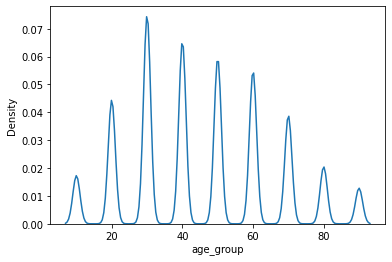

In [ ]:
sns.kdeplot(df2['age_group'])

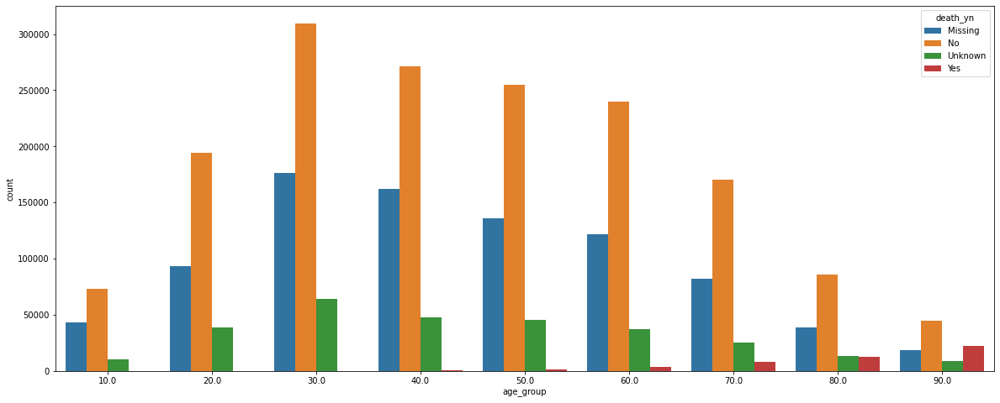

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(x=df2.age_group, hue=df2.death_yn)

In [ ]:
#for feature in list(df2.columns):
 #   print(f'======================= {feature} =======================')
 #   print(df2[feature].value_counts(dropna=False))
 #   print('')

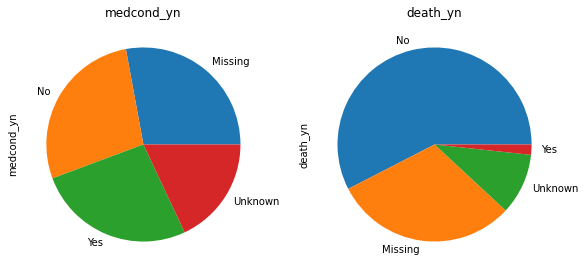

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(141)
plt.title('medcond_yn')
df2['medcond_yn'].value_counts().plot.pie()

plt.subplot(142)
plt.title('death_yn')
df2['death_yn'].value_counts().plot.pie()

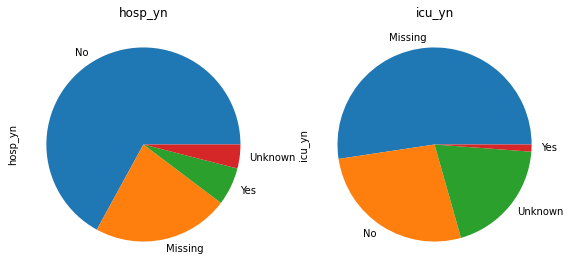

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(141)
plt.title('hosp_yn')
df2['hosp_yn'].value_counts().plot.pie()

plt.subplot(142)
plt.title('icu_yn')
df2['icu_yn'].value_counts().plot.pie()

In [ ]:
df2['sex'].value_counts()

Female     1512481
Male       1325780
Unknown      14807
Missing       2934
Other          122
Name: sex, dtype: int64

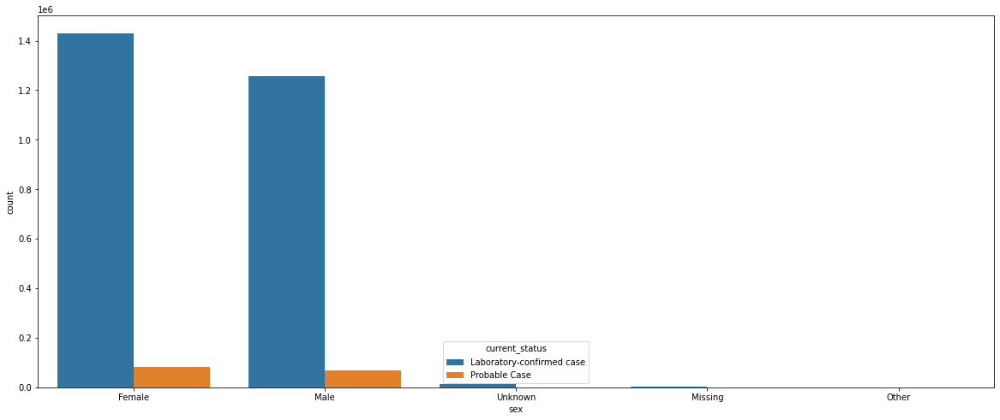

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.sex, hue=df2.current_status)

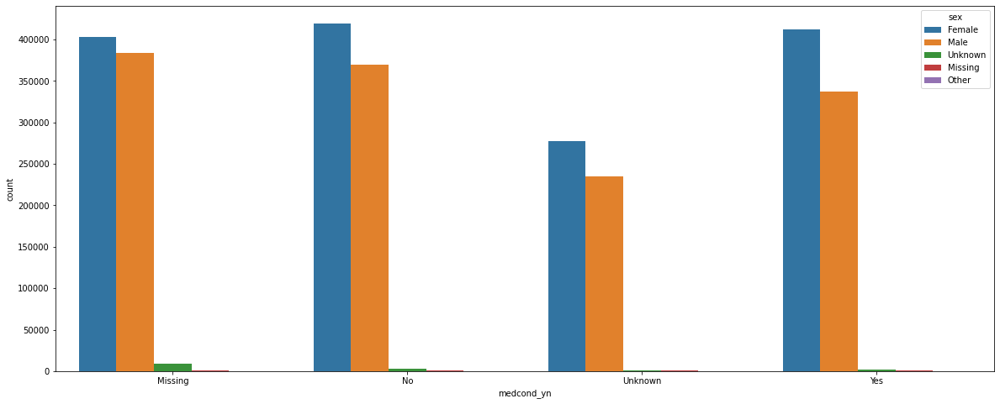

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.medcond_yn, hue=df2.sex)

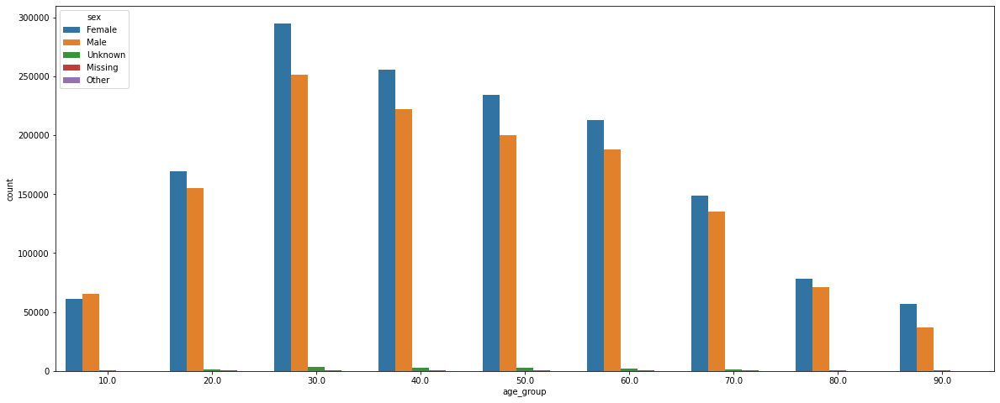

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.age_group, hue=df2.sex)

*More Females than males in almost all age groups* 

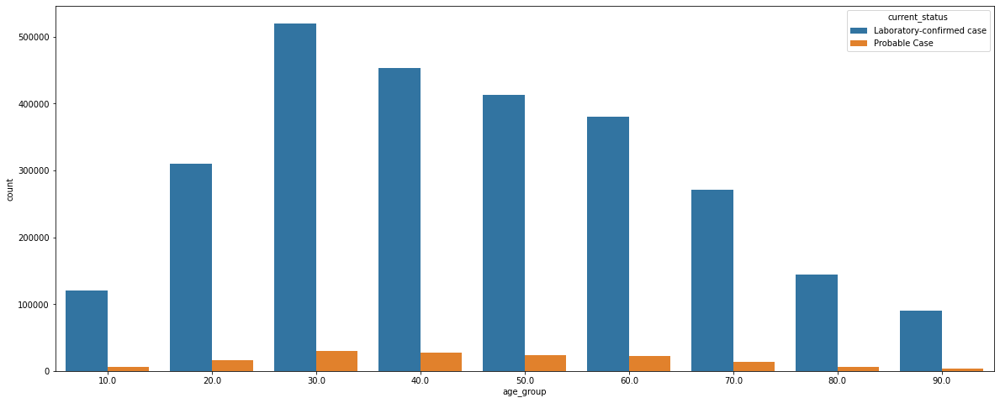

In [ ]:
plt.figure(figsize=(20,8))
sns.countplot(df2.age_group, hue=df2.current_status)

# **Project Plan:** 

This is an individual effort.

February: Data gathering and clean-up.

March: Initial analysis and identifying patterns

April: Final analysis and predictive modelling


# **End Goal**

The end goal of the project is to analyse the spread of COVID-19 and its impact on USA population. We will be analysing trends based on demographics as well as how the disease spread in different states in US.